In [2]:
%matplotlib notebook
import os
import numpy as np
import torch
from torch import nn
from torch.nn import functional as F
import torch.utils.data as td
import torchvision as tv
import pandas as pd
from PIL import Image
from matplotlib import pyplot as plt
import nntools as nt

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [4]:
# Child class of the nntools NeuralNetwork class
class NNRegressor(nt.NeuralNetwork):
    def __init__(self):
        super(NNRegressor, self).__init__()
        self.MSE = nn.MSELoss(size_average=None, reduce=None, reduction='sum')
    def criterion(self, y, d):
        return self.MSE(y, d)

In [5]:
# Child class of the NNRegressor class
class VGGTransfer(NNRegressor):
    def __init__(self, fine_tuning=False): #want to keep existing weights/biases
        super(VGGTransfer, self).__init__()
        vgg = tv.models.vgg16(pretrained=True) # get pretrained VGG16
        for param in vgg.parameters():
            param.requires_grad = fine_tuning
        
        self.net = nn.ModuleList()
        self.net = vgg.features # get just the CNN layers, no fully connected layers
    # do a forward pass through the network.  Return a dictionary wit the desired layer activations
    def forward(self, x):
        rep = {}
        rep['r12'] = self.net[:4](x)
        rep['r22'] = self.net[:9](x)
        rep['r33'] = self.net[:16](x)
        rep['r43'] = self.net[:23](x)

        
        
        return rep #

In [6]:
# Class to implement conv layer with stride 1/2 for use in the ImageTransorm class
class UpsampleConvLayer(torch.nn.Module):

    def __init__(self, in_channels, out_channels, kernel_size, stride, upsample=None):
        super(UpsampleConvLayer, self).__init__()
        self.upsample = upsample
        reflection_padding = kernel_size // 2
        self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
        self.conv2d = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride)

    def forward(self, x):
        x_in = x
        if self.upsample:
            x_in = torch.nn.functional.interpolate(x_in, mode='nearest', scale_factor=self.upsample)
        out = self.reflection_pad(x_in)
        out = self.conv2d(out)
        return out

In [7]:
# Image Transorm matrix as described by Johnson et al
class ImageTransform(torch.nn.Module):
    def __init__(self):
        super(ImageTransform, self).__init__()
    
        self.pad = torch.nn.ReflectionPad2d((40,40,40,40))
        self.conv1 = torch.nn.Conv2d(3,32,9,padding=4)
        self.bn1 = torch.nn.BatchNorm2d(32)
        self.conv2 = torch.nn.Conv2d(32,64,3,stride=2,padding=1)
        self.bn2 = torch.nn.BatchNorm2d(64)
        self.conv3 = torch.nn.Conv2d(64,128,3,stride=2,padding=1)
        self.bn3 = torch.nn.BatchNorm2d(128)
        self.res1 = nn.Sequential(
            torch.nn.Conv2d(128,128,3),
            torch.nn.BatchNorm2d(128),
            torch.nn.ReLU(),
            torch.nn.Conv2d(128,128,3),
            torch.nn.BatchNorm2d(128)
        )
        self.res2 = nn.Sequential(
            torch.nn.Conv2d(128,128,3),
            torch.nn.BatchNorm2d(128),
            torch.nn.ReLU(),
            torch.nn.Conv2d(128,128,3),
            torch.nn.BatchNorm2d(128)
        )
        self.res3 = nn.Sequential(
            torch.nn.Conv2d(128,128,3),
            torch.nn.BatchNorm2d(128),
            torch.nn.ReLU(),
            torch.nn.Conv2d(128,128,3),
            torch.nn.BatchNorm2d(128)
        )
        self.res4 = nn.Sequential(
            torch.nn.Conv2d(128,128,3),
            torch.nn.BatchNorm2d(128),
            torch.nn.ReLU(),
            torch.nn.Conv2d(128,128,3),
            torch.nn.BatchNorm2d(128)
        )
        self.res5 = nn.Sequential(
            torch.nn.Conv2d(128,128,3),
            torch.nn.BatchNorm2d(128),
            torch.nn.ReLU(),
            torch.nn.Conv2d(128,128,3),
            torch.nn.BatchNorm2d(128)
        )
        self.conv4 = UpsampleConvLayer(128, 64, kernel_size=3, stride=1, upsample=2)
        self.bn4 = torch.nn.BatchNorm2d(64)
        self.conv5 = UpsampleConvLayer(64, 32, kernel_size=3, stride=1, upsample=2)
        self.bn5 = torch.nn.BatchNorm2d(32)
        self.conv6 = torch.nn.Conv2d(32,3,9,padding=4)
        self.tanh = torch.nn.Tanh()
        
    def forward(self, x):
    
        h = self.pad(x)
        
        h = F.relu(self.bn1(self.conv1(h)))
        
        h = F.relu(self.bn2(self.conv2(h)))
        
        h = F.relu(self.bn3(self.conv3(h)))
        
        h = F.relu(h[:,:,2:82,2:82] + self.res1(h)) 
        
        h = F.relu(h[:,:,2:78,2:78] + self.res2(h))
        
        h = F.relu(h[:,:,2:74,2:74] + self.res3(h))
        
        h = F.relu(h[:,:,2:70,2:70] + self.res4(h))
        
        h = F.relu(h[:,:,2:66,2:66] + self.res4(h))
        
        h = F.relu(self.bn4(self.conv4(h)))
        
        h = F.relu(self.bn5(self.conv5(h)))
        
        h = self.conv6(h)
        
        y = (self.tanh(h) + 1) / 2
        return y
ImageTransformNet = ImageTransform()
for param in ImageTransformNet.parameters():
    param.requires_grad = True

In [8]:
# DnCNN class from Assignment 4. Used in place of ImageTransform for experimentation
class DnCNN(NNRegressor):
    
    def __init__(self, D, C=64):
        super(DnCNN, self).__init__()
        self.D = D
        self.conv = nn.ModuleList()
        self.conv.append(nn.Conv2d(3, C, 3, padding=1))
        
        for k in range(D):
            self.conv.append(nn.Conv2d(C, C, 3, padding=1))
            
        self.conv.append(nn.Conv2d(C, 3, 3, padding=1))
        
        self.bn = nn.ModuleList()
        for k in range(D):
            self.bn.append(nn.BatchNorm2d(C))
        
    def forward(self, x):
        D = self.D
        h = F.relu(self.conv[0](x))
        
        for k in range(D):
            h = F.relu(self.bn[k](self.conv[k + 1](h)))
        
        y = self.conv[D+1](h) + x
        return y

In [9]:
# UDnCNN class from Assignment 4. Used in place of ImageTransform for experimentation
class UDnCNN(NNRegressor):
    
    def __init__(self, D, C=64):
        super(UDnCNN, self).__init__()
        self.D = D
        self.conv = nn.ModuleList()
        self.conv.append(nn.Conv2d(3, C, 3, padding=1))
        
        for k in range(D):
            self.conv.append(nn.Conv2d(C, C, 3, padding=1))
            
        self.conv.append(nn.Conv2d(C, 3, 3, padding=1))
        
        self.bn = nn.ModuleList()
        for k in range(D):
            self.bn.append(nn.BatchNorm2d(C))
        
    def forward(self, x):
        D = self.D
        h1 = F.relu(self.conv[0](x))
        h = h1
        
        features = []
        features.append(h1)
        indeces = []
        
        # Contracting
        for k in range(int(D/2 - 1)):
            r = F.relu(self.bn[k](self.conv[k + 1](h)))
            h, ind = F.max_pool2d(r, kernel_size=2, return_indices=True)
            features.append(h)
            indeces.append(ind)
            
        inner1 = F.relu(self.bn[int(D/2 - 1)](self.conv[int(D/2)](features[int(D/2 - 1)])))
        inner2 = F.relu(self.bn[int(D/2)](self.conv[int(D/2)+1](inner1)))
        
        h = inner2
        
        # Expanding
        for k in range(int(D/2 + 1), D):
            p = F.max_unpool2d((h + features[D-k])/np.sqrt(2), indices=indeces[D-k-1], 
                               kernel_size=2, output_size=features[D-k-1].shape)
            h = F.relu(self.bn[k](self.conv[k + 1](p)))
        
        
        y = self.conv[D + 1]((h + h1) / np.sqrt(2)) + x
                                  
        return y

In [10]:
# DUDnCNN class from Assignment 4. Used in place of ImageTransform for experimentation
class DUDnCNN(NNRegressor):
    
    def __init__(self, D, C=64):
        super(DUDnCNN, self).__init__()
        self.D = D
        self.conv = nn.ModuleList()
        self.conv.append(nn.Conv2d(3, C, 3, padding=1))
        
        self.conv.append(nn.Conv2d(C, C, 3, padding=1))  
        
        for k in range(1, int(D/2)):
            self.conv.append(nn.Conv2d(C, C, 3, padding=2**k, dilation=2**k))  
        
        for k in range(int(D/2) + 1, D):
            self.conv.append(nn.Conv2d(C, C, 3, padding=2**(D-k), dilation=2**(D-k)))
            
        self.conv.append(nn.Conv2d(C, C, 3, padding=1))
        
        self.conv.append(nn.Conv2d(C, 3, 3, padding=1))
        
        self.bn = nn.ModuleList()
        for k in range(D):
            self.bn.append(nn.BatchNorm2d(C))
        
    def forward(self, x):
        D = self.D
        h = F.relu(self.conv[0](x))
        
        features = []
        features.append(h)
        
        outer1 = F.relu(self.bn[0](self.conv[1](h)))
        
        features.append(outer1)
        
        for k in range(int(D/2)):
            torch.backends.cudnn.benchmark=True
            h = F.relu(self.bn[k+1](self.conv[k + 2](h)))
            torch.backends.cudnn.benchmark=False
            features.append(h)
        
        for k in range(int(D/2) + 1, D - 1):
            torch.backends.cudnn.benchmark=True
            h = F.relu(self.bn[k](self.conv[k + 1]((h + features[D-k])/np.sqrt(2))))
            torch.backends.cudnn.benchmark=False
            
        outer2 = F.relu(self.bn[D-1](self.conv[D]((h + outer1) / np.sqrt(2))))
        
        y = self.conv[D+1]((outer2 + features[0]) / np.sqrt(2)) + x
        return y

In [11]:
# Paths to dataset
datasetTrainDir = "/datasets/COCO-2015/train2014"
datasetTestDir = "/datasets/COCO-2015/val2014"

In [12]:
# child of Dataset to pull images from the COCO dataset
class COCODataset(td.Dataset):
    def __init__(self, root_dir, mode = 'train', image_size=(256, 256)):
        super(COCODataset, self).__init__()
        self.image_size = image_size
        self.images_dir = os.path.join(root_dir)
        self.files = os.listdir(self.images_dir)
        self.mode = mode
    def __len__(self):
        return len(self.files)
    def __repr__(self):
        return "COCODataset(mode={}, image_size={})". \
            format(self.mode, self.image_size)
    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.files[idx])
        clean = Image.open(img_path).convert('RGB')
        transform = tv.transforms.Compose([
            tv.transforms.Resize(self.image_size),
            tv.transforms.ToTensor(),
            tv.transforms.Normalize((.5,.5,.5),(.5,.5,.5)) #given range [0,1] for all channels
            ])
        clean = transform(clean)
        return clean

In [13]:
# myimshow provided in assignments
def myimshow(image, ax=plt):
    image = image.to('cpu').numpy()
    image = np.moveaxis(image, [0, 1, 2], [2, 0, 1])
    image = (image + 1) / 2
    image[image < 0] = 0
    image[image > 1] = 1
    h = ax.imshow(image)
    ax.axis('off')
    return h

train_set = COCODataset(datasetTrainDir)
test_set = COCODataset(datasetTestDir)

x = train_set.__getitem__(11).shape
print(x)

torch.Size([3, 256, 256])


In [14]:
# Prepare a "Style" image and a photo that is not in the dataset to test.
transform = tv.transforms.Compose([
            tv.transforms.Resize((256,256)),
            tv.transforms.ToTensor(),
            tv.transforms.Normalize((.5,.5,.5),(.5,.5,.5)) #given range [0,1] for all channels
            ])
photo_path = 'photo.jpg'
photo = Image.open(photo_path)
p = transform(photo)
p = p[None,:,:,:] # add a singleton dimension for the batch size

art_path = 'picasso.jpg'
art = Image.open(art_path)
styleimage = transform(art)
styleimage = styleimage[None,:,:,:]
styleimage = styleimage.to(device)

p = p.to(device)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /tmp/xdg-cache/torch/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:10<00:00, 51.5MB/s] 


In [15]:
# Compute the gram matrices described in Johnson
def Gram(featresp):
    return torch.bmm(featresp,featresp.transpose(1, 2))  

In [16]:
# To calculate the variation loss
def totalvariation(image):
    
    loss = torch.mean(torch.abs(image[:, :, :, :-1] - image[:, :, :, 1:])) + \
        torch.mean(torch.abs(image[:, :, :-1, :] - image[:, :, 1:, :]))
    return loss

In [17]:
# get 100 images
image_list = []
for i in range(100):
    image_list.append(train_set.__getitem__(i))

In [18]:
# Function to train the transform network.  Saves model to model_path.  Returns the trained model and total loss history
def styletransfer(train_set, transformNet, model_path, device, styleimage, \
                  content_weight=1, style_weight=1, var_weight=1): 
    # size of training set
    N = train_set.__len__()
    # size of minibatch
    B = 4
    # number of minibatches
    NB = int((N+B-1)/B) 

    optimizer = torch.optim.Adam(transformNet.parameters(), lr=.001)

    fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(7,6))

    loss_history = []
    
    vgg = VGGTransfer().to(device)
    styleoutput = vgg(styleimage)
    # style losses
    styleout12 = styleoutput['r12'].view(1,64,-1) #relu12
    styleout22 = styleoutput['r22'].view(1,128,-1) #relu22
    styleout33 = styleoutput['r33'].view(1,256,-1) #relu33
    styleout43 = styleoutput['r43'].view(1,512,-1) #relu43

    #get style gram matrices
    gram1o = Gram(styleout12)/(styleout12.numel())
    gram2o = Gram(styleout22)/(styleout22.numel())
    gram3o = Gram(styleout33)/(styleout33.numel())
    gram4o = Gram(styleout43)/(styleout43.numel())
    
    for epochs in range(2):

        shuffled_indices = np.random.permutation(range(N))

        for i in range(NB):
            optimizer.zero_grad()
            
            # Prepare minibatch size 4
            minibatch_indices = shuffled_indices[B*i:min(B*(i+1), N)]
            
            p1 = train_set.__getitem__(minibatch_indices[0])
            p2 = train_set.__getitem__(minibatch_indices[1])
            p3 = train_set.__getitem__(minibatch_indices[2])
            p4 = train_set.__getitem__(minibatch_indices[3])
            
            contentimage = torch.stack((p1,p2,p3,p4))
            contentimage = contentimage.to(device)

            yhat = transformNet(contentimage).to(device) 
            yhatvarloss = totalvariation(yhat)
            
            # yhat through vgg
            output = vgg(yhat)
            yhatout12 = output['r12'].view(B,64,-1)  #relu12
            yhatout22 = output['r22'].view(B,128,-1) #relu22
            yhatout33 = output['r33'].view(B,256,-1) #relu33
            yhatout43 = output['r43'].view(B,512,-1) #relu43

            # content losses
            contentoutput = vgg(contentimage)
            contentout33 = contentoutput['r33'].view(B,256,-1) #relu33
            #2matrix norm?
            contentloss = ((contentout33 - yhatout33)**2).sum() / (yhatout33.numel())

            #get yhat gram matrices
            gram1 = Gram(yhatout12)/(yhatout12.numel()/B)
            gram2 = Gram(yhatout22)/(yhatout22.numel()/B)
            gram3 = Gram(yhatout33)/(yhatout33.numel()/B)
            gram4 = Gram(yhatout43)/(yhatout43.numel()/B)


            #get frobenius square norm
            l1 = torch.norm(gram1-gram1o, dim=(1,2))**2 / B
            l2 = torch.norm(gram2-gram2o, dim=(1,2))**2 / B
            l3 = torch.norm(gram3-gram3o, dim=(1,2))**2 / B
            l4 = torch.norm(gram4-gram4o, dim=(1,2))**2 / B

            #total style loss
            styleloss = (l1.sum() + l2.sum() + l3.sum() + l4.sum()) / 4

            #get total loss
            loss = (content_weight * contentloss) + (style_weight * styleloss) + (var_weight * yhatvarloss)

            #backprop
            loss.backward()

            #parameter search
            optimizer.step()

            #display during optimization
            if i % 10 == 0:

                torch.save(transformNet, model_path)

                lo = loss.detach().cpu()
                loss_history.append(lo)

                axes[1].clear()
                axes[1].plot(loss_history)

                print('loss',loss)
                print('contentloss', content_weight*contentloss)
                print('styleloss', style_weight*styleloss)
                print('varloss', var_weight * yhatvarloss)
                
                axes[0].clear()
                image = image_list[1]
                image = image[None,:,:,:]
                image = image.to(device)
                stylized_image = transformNet(image)
                xx = stylized_image.detach().cpu()
                xx = xx[0]
                myimshow(xx, axes[0])
            plt.tight_layout()
            fig.canvas.draw()
            
    return transformNet, loss_history

<IPython.core.display.Javascript object>


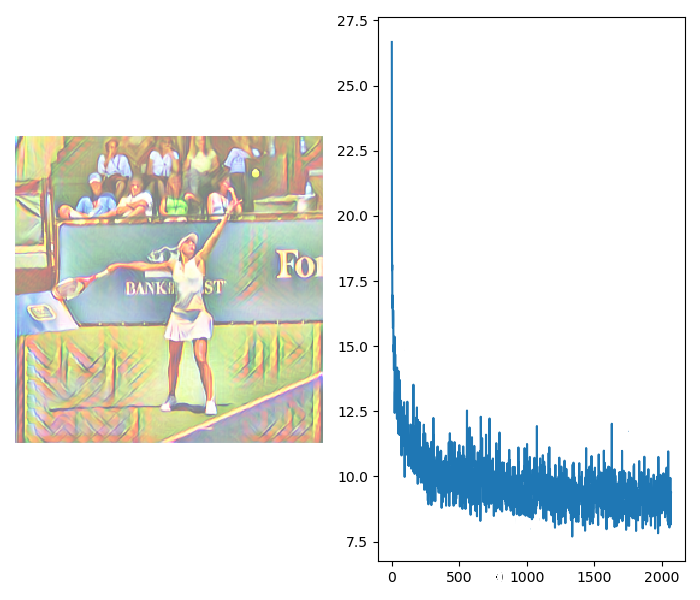

loss tensor(26.6765, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(7.0789, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(18.9342, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.6634, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(19.1764, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(8.0245, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(10.8639, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.2880, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(17.9159, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(7.5896, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(10.0405, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.2858, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(18.1196, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.4042, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(7.2707, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.444

IndexError: index 3 is out of bounds for axis 0 with size 3

In [73]:
# Train a ImageTransform model as described by Johnson with style_weight = 10
JohnsonTransform = ImageTransform().to(device)

net, loss_history = styletransfer(train_set, JohnsonTransform, 'JohnsonModelSW10', device, styleimage, \
                  content_weight=1, style_weight=10, var_weight=5)

<IPython.core.display.Javascript object>


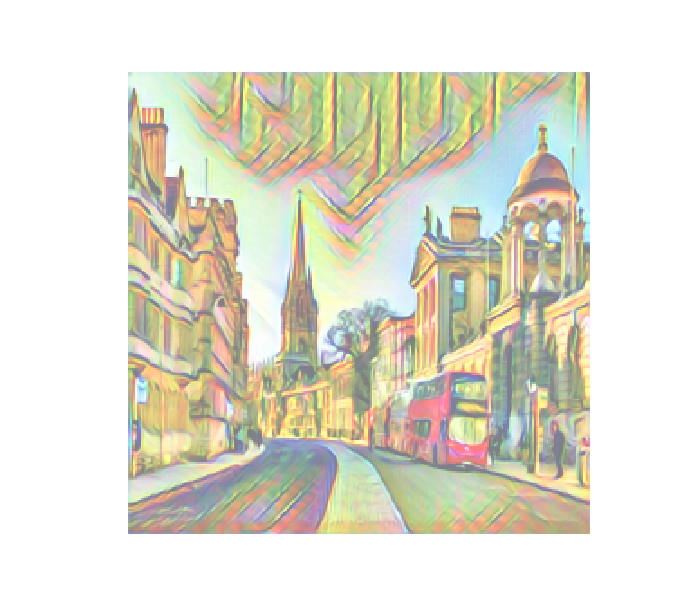

In [93]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('JohnsonModelSW10')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


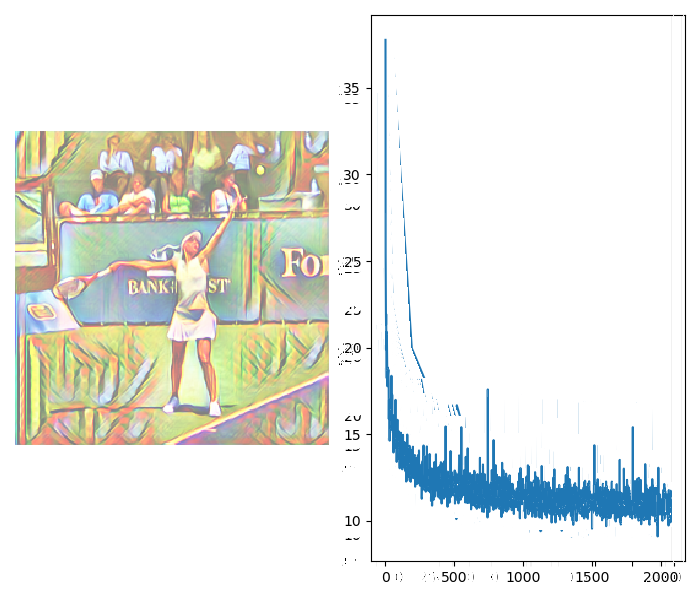

loss tensor(37.7663, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(8.0913, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(28.9254, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.7496, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(25.3562, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(9.6073, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(15.3911, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.3577, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(23.4229, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(12.0435, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(10.9066, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.4727, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(22.1262, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.6861, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(11.0209, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.4

IndexError: index 3 is out of bounds for axis 0 with size 3

In [92]:
# Train a ImageTransform model as described by Johnson with style_weight = 15
JohnsonTransform = ImageTransform().to(device)

net, loss_history = styletransfer(train_set, JohnsonTransform, 'JohnsonModelSW15', device, styleimage, \
                  content_weight=1, style_weight=15, var_weight=5)

<IPython.core.display.Javascript object>


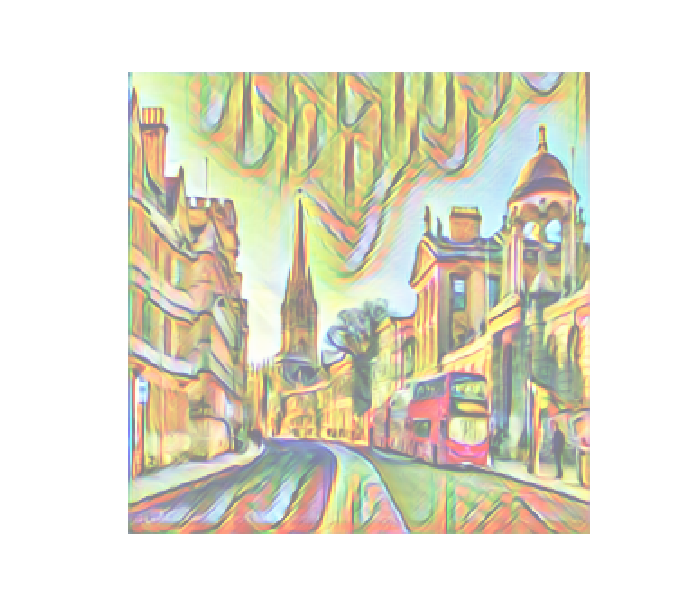

In [94]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('JohnsonModelSW15')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


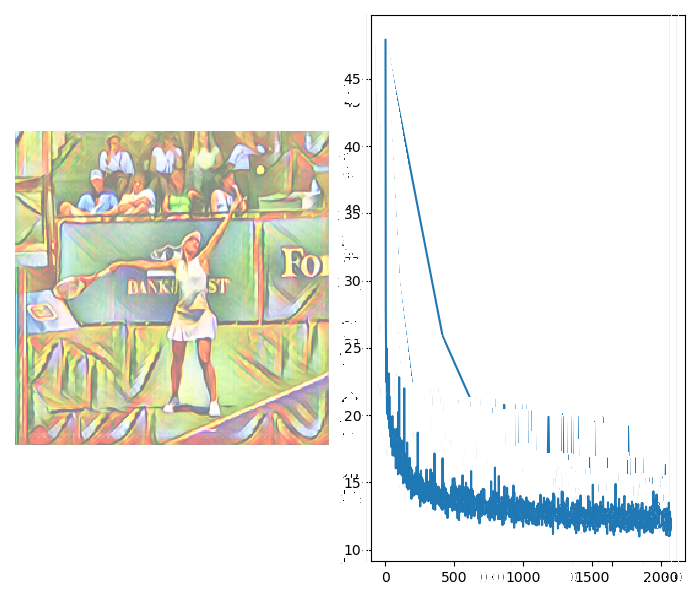

loss tensor(47.8902, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(8.3147, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(38.8470, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.7285, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(34.1018, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(13.2838, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(20.2947, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.5233, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(28.0843, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(13.1565, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(14.5128, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.4150, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(26.5870, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(11.6572, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(14.3973, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.

IndexError: index 3 is out of bounds for axis 0 with size 3

In [95]:
# Train a ImageTransform model as described by Johnson with style_weight = 20
JohnsonTransform = ImageTransform().to(device)

net, loss_history = styletransfer(train_set, JohnsonTransform, 'JohnsonModelSW20', device, styleimage, \
                  content_weight=1, style_weight=20, var_weight=5)


<IPython.core.display.Javascript object>


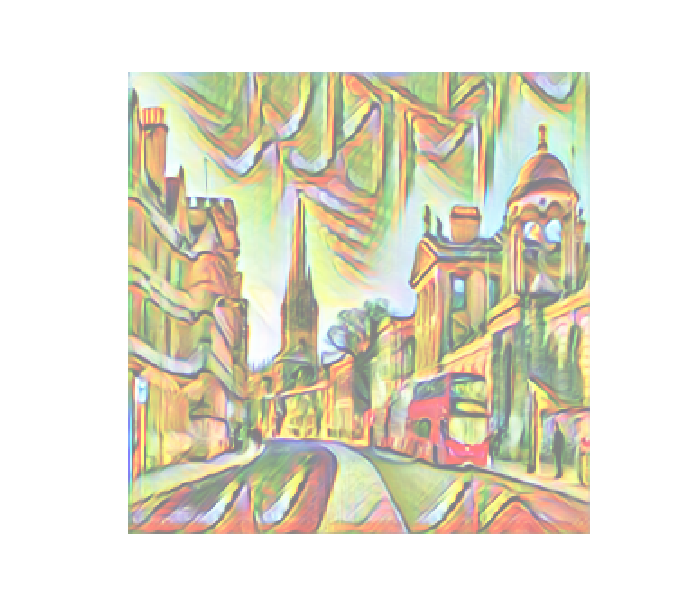

In [96]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('JohnsonModelSW20')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


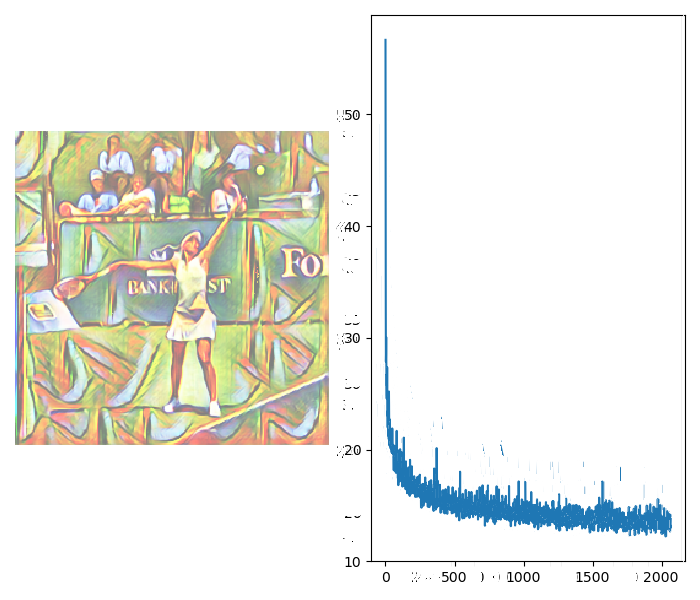

loss tensor(56.6851, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(8.2355, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(47.6849, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.7647, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(37.1053, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(12.4661, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(24.3068, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.3325, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(32.6944, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(11.3318, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(21.0280, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.3346, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(27.8617, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(12.0409, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(15.3543, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.

IndexError: index 3 is out of bounds for axis 0 with size 3

In [97]:
# Train a ImageTransform model as described by Johnson with style_weight = 25
JohnsonTransform = ImageTransform().to(device)

net, loss_history = styletransfer(train_set, JohnsonTransform, 'JohnsonModelSW25', device, styleimage, \
                  content_weight=1, style_weight=25, var_weight=5)

<IPython.core.display.Javascript object>


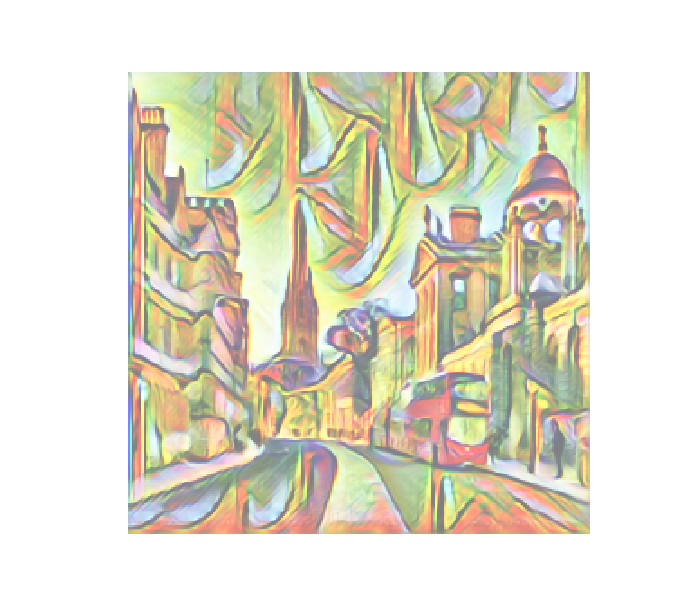

In [98]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('JohnsonModelSW25')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


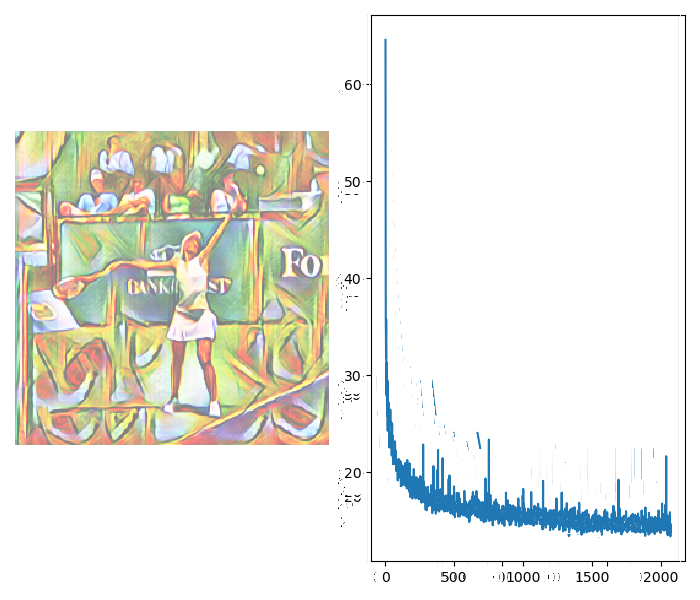

/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type ImageTransform. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type ReflectionPad2d. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type Sequential. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type ReLU. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/li

loss tensor(64.5967, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(5.8387, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(58.0530, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.7049, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(45.6202, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(14.3248, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(30.9632, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.3322, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(35.5485, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(12.3453, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(22.7830, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.4202, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(34.3136, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(13.7255, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(20.0919, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.

IndexError: index 3 is out of bounds for axis 0 with size 3

In [31]:
# Train a ImageTransform model as described by Johnson with style_weight = 30
JohnsonTransform = ImageTransform().to(device)

net, loss_history = styletransfer(train_set, JohnsonTransform, 'JohnsonModelSW30', device, styleimage, \
                  content_weight=1, style_weight=30, var_weight=5)

<IPython.core.display.Javascript object>


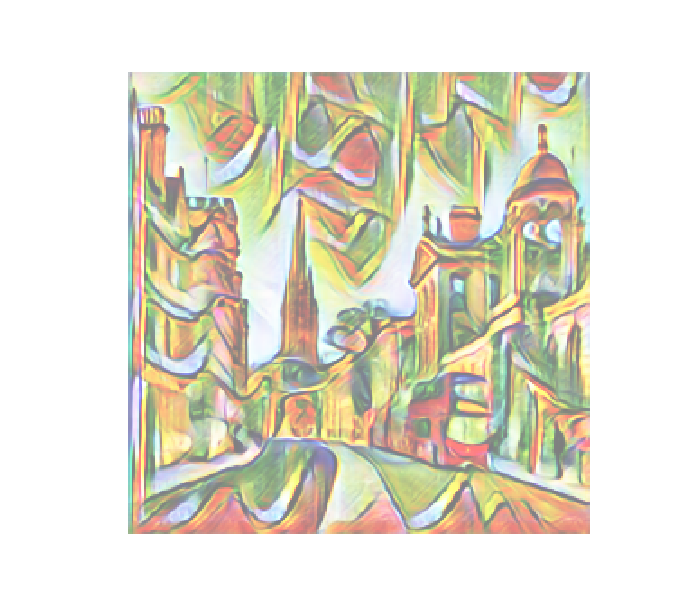

In [32]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('JohnsonModelSW30')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


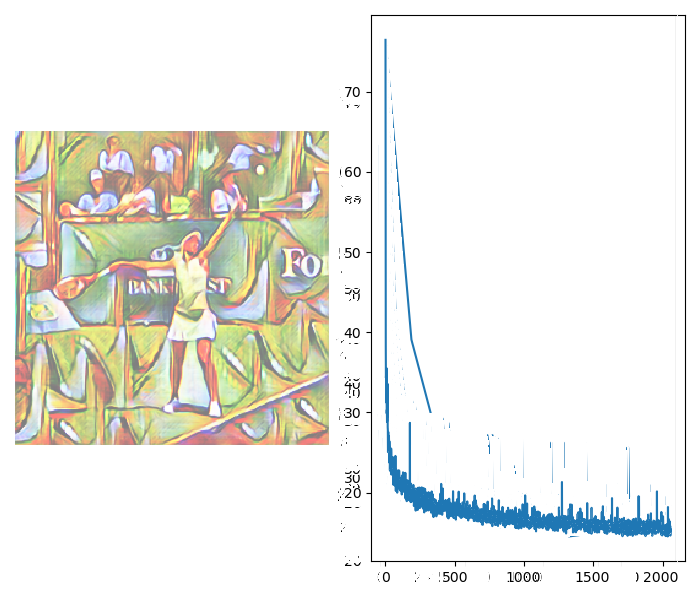

/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type ImageTransform. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type ReflectionPad2d. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type Conv2d. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type BatchNorm2d. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda

loss tensor(76.4728, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(8.3404, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(67.4063, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.7261, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(47.7032, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.3841, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(36.9557, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.3634, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(38.2185, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.3969, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(27.3996, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.4220, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(34.3235, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(13.4547, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(20.3441, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.

IndexError: index 3 is out of bounds for axis 0 with size 3

In [19]:
# Train a ImageTransform model as described by Johnson with style_weight = 35
JohnsonTransform = ImageTransform().to(device)

net, loss_history = styletransfer(train_set, JohnsonTransform, 'JohnsonModelSW35', device, styleimage, \
                  content_weight=1, style_weight=35, var_weight=5)

<IPython.core.display.Javascript object>


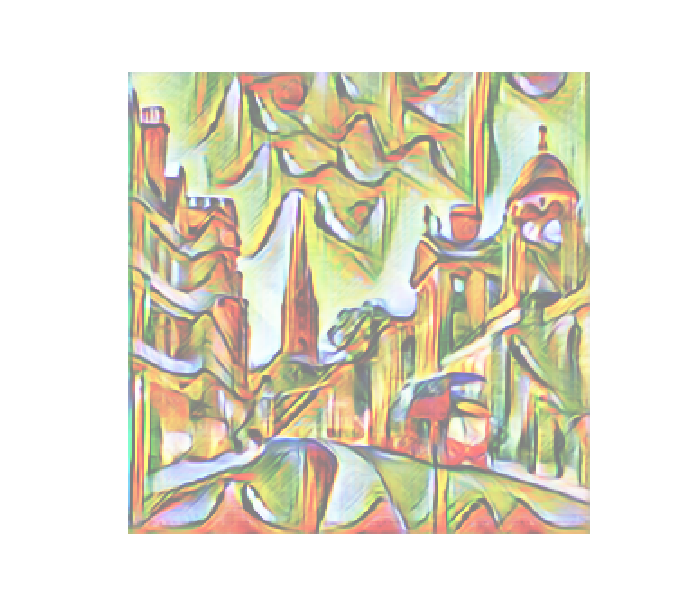

In [20]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('JohnsonModelSW35')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


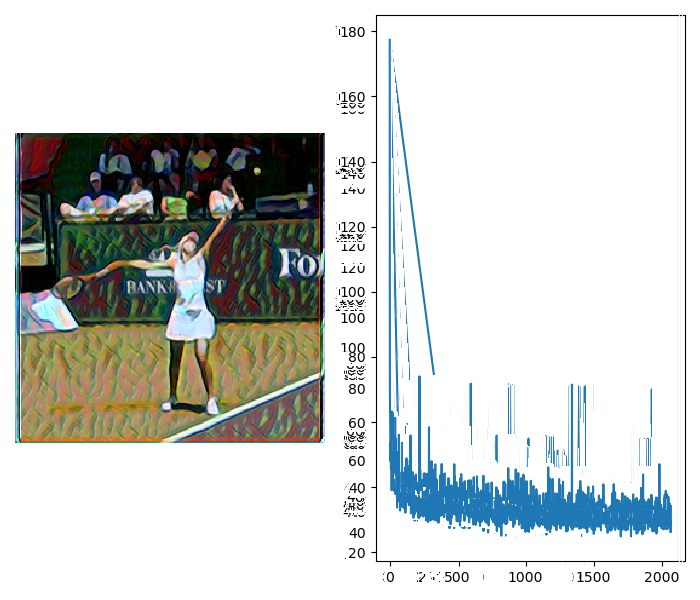

loss tensor(177.3735, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(9.1479, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(166.3975, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.8281, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(69.9813, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(4.9191, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(64.3402, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.7220, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(64.9833, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(3.9557, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(60.3723, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.6553, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(59.7204, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(5.9448, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(52.8363, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.9

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



loss tensor(31.6252, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.1974, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(20.3283, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.0995, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(32.6898, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(9.2309, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(22.3881, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.0708, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(31.8480, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.0576, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(20.6893, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.1010, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(35.5381, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(9.7388, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(24.6278, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.1

IndexError: index 3 is out of bounds for axis 0 with size 3

In [99]:
# Train a DnCNN network with depth D = 4
DnCNN_net = DnCNN(4).to(device)

net, loss_history = styletransfer(train_set, DnCNN_net, 'DnCNNModelD4', device, styleimage, \
                  content_weight=1, style_weight=60, var_weight=5)


<IPython.core.display.Javascript object>


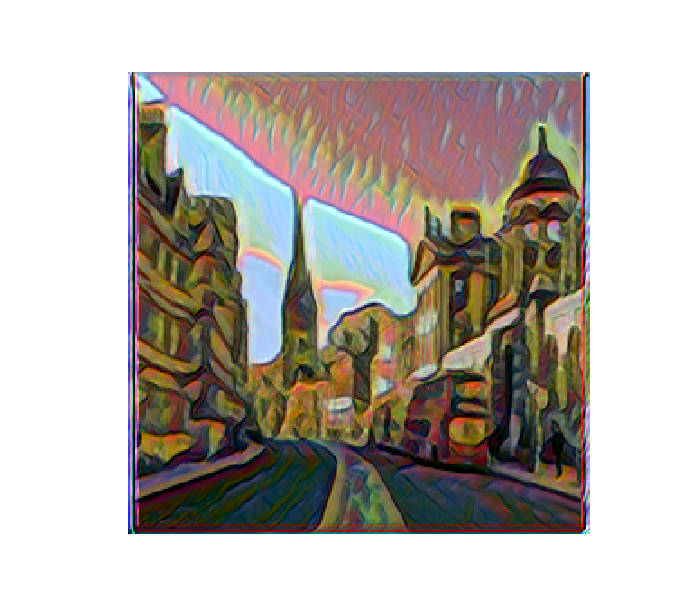

In [100]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('DnCNNModelD4')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


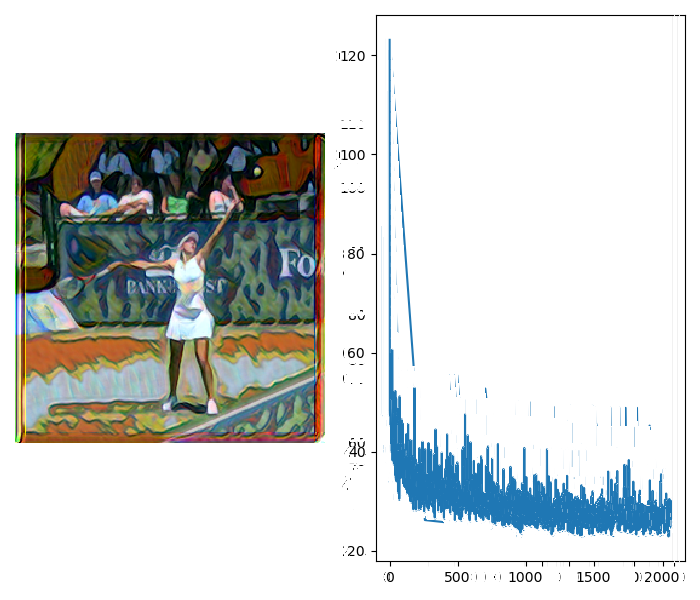

loss tensor(123.1181, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(7.2299, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(113.3753, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(2.5128, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(47.8068, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(6.8204, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(40.2404, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.7460, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(47.2069, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(8.0207, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(37.9314, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.2548, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(49.8046, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.5114, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(38.3557, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.

IndexError: index 3 is out of bounds for axis 0 with size 3

In [101]:
# Train a DnCNN network with depth D = 8
DnCNN_net = DnCNN(8).to(device)

net, loss_history = styletransfer(train_set, DnCNN_net, 'DnCNNModelD8', device, styleimage, \
                  content_weight=1, style_weight=60, var_weight=5)


<IPython.core.display.Javascript object>


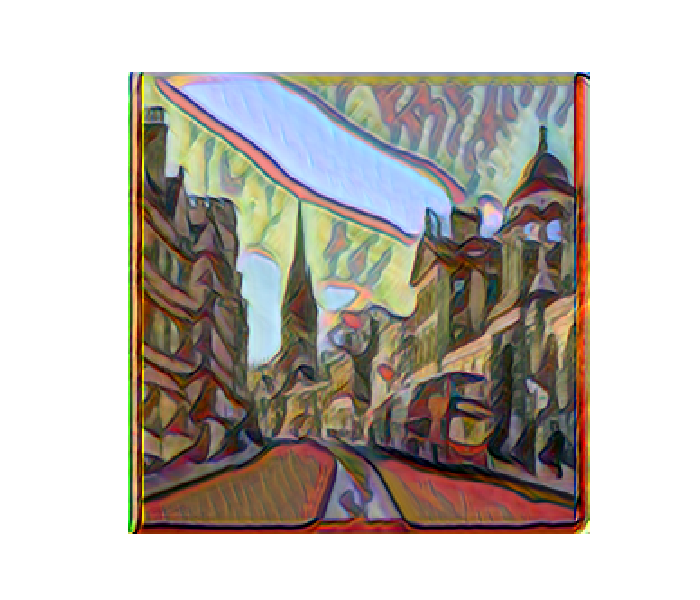

In [102]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('DnCNNModelD8')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


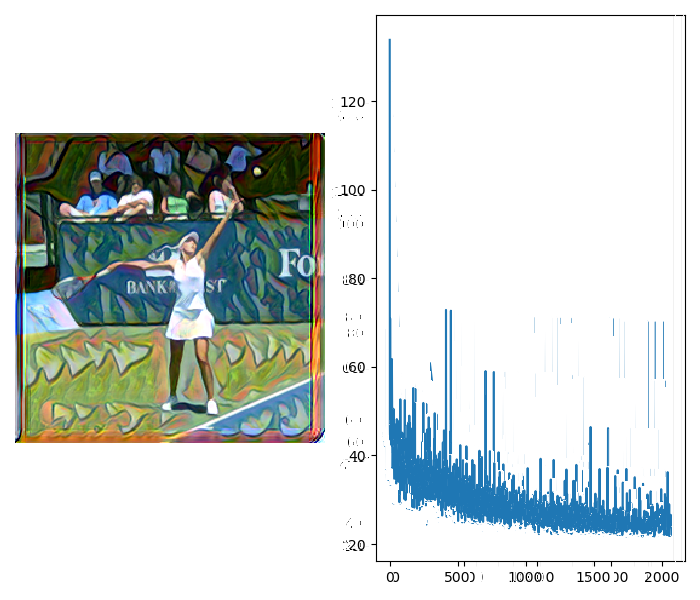

loss tensor(133.9098, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(7.0660, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(124.1880, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(2.6558, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(46.7731, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(6.8948, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(39.0502, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.8281, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(44.6295, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(6.3447, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(37.4812, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.8036, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(70.9778, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(6.1549, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(63.8233, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.9

IndexError: index 3 is out of bounds for axis 0 with size 3

In [103]:
# Train a DnCNN network with depth D = 12
DnCNN_net = DnCNN(12).to(device)

net, loss_history = styletransfer(train_set, DnCNN_net, 'DnCNNModelD12', device, styleimage, \
                  content_weight=1, style_weight=60, var_weight=5)


<IPython.core.display.Javascript object>


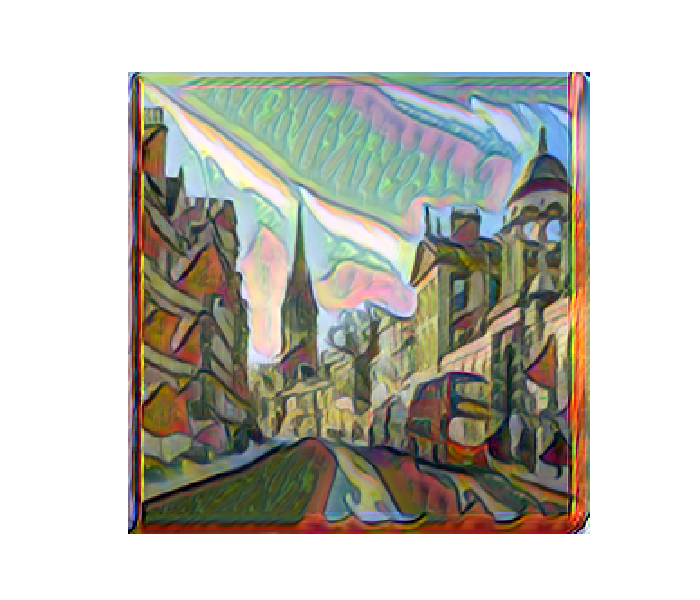

In [104]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('DnCNNModelD12')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


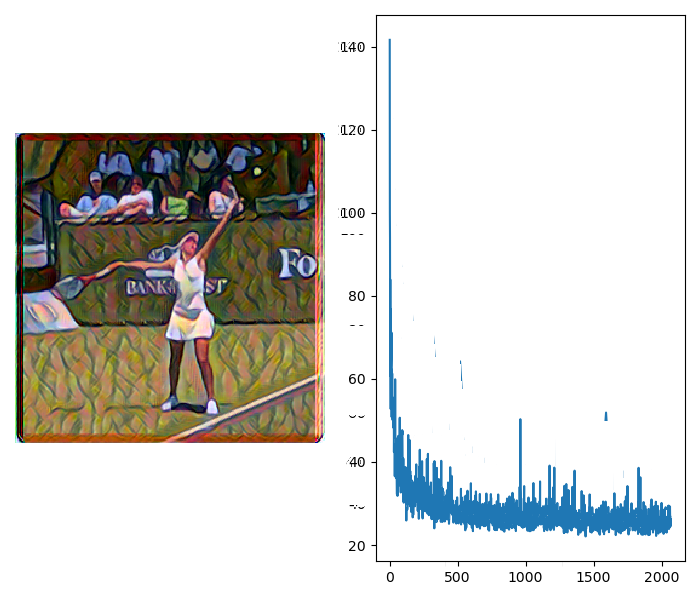

/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type UDnCNN. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type MSELoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type ModuleList. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type Conv2d. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/si

loss tensor(141.6569, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(5.0547, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(133.9123, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(2.6899, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(99.9598, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(3.9104, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(93.9942, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(2.0551, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(93.9707, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(4.0539, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(88.0954, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.8214, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(73.2625, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(3.5373, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(68.2516, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.4

IndexError: index 3 is out of bounds for axis 0 with size 3

In [18]:
# Train a UDnCNN network with depth D = 4
UDnCNN_net = UDnCNN(4).to(device)

net, loss_history = styletransfer(train_set, UDnCNN_net, 'UDnCNNModelD4', device, styleimage, \
                  content_weight=1, style_weight=60, var_weight=5)

<IPython.core.display.Javascript object>


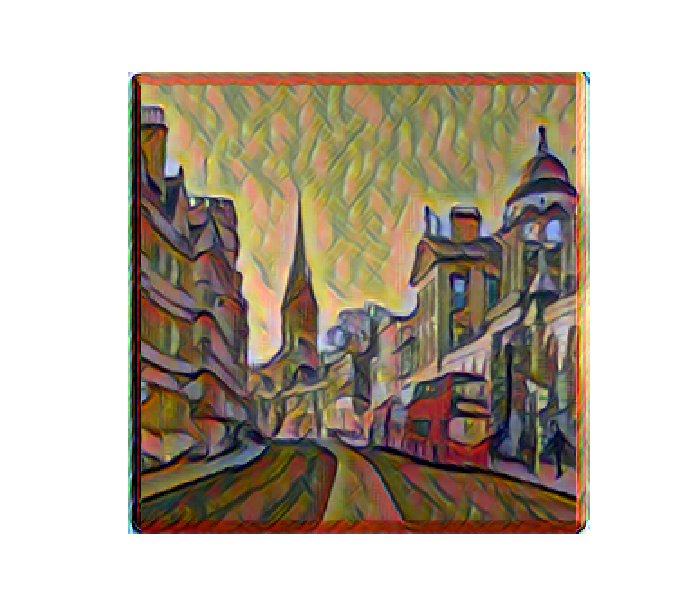

In [19]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('UDnCNNModelD4')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


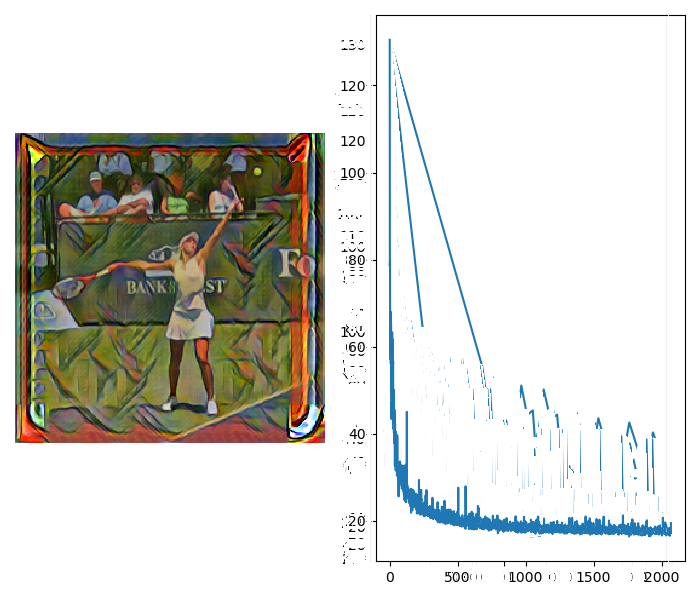

loss tensor(130.4717, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(5.1489, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(122.5780, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(2.7447, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(78.5648, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(3.8226, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(72.7665, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.9758, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(79.8230, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(3.2740, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(74.8603, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.6887, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(66.2429, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(4.1201, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(60.6670, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.4

IndexError: index 3 is out of bounds for axis 0 with size 3

In [20]:
# Train a UDnCNN network with depth D = 8
UDnCNN_net = UDnCNN(8).to(device)

net, loss_history = styletransfer(train_set, UDnCNN_net, 'UDnCNNModelD8', device, styleimage, \
                  content_weight=1, style_weight=60, var_weight=5)

<IPython.core.display.Javascript object>


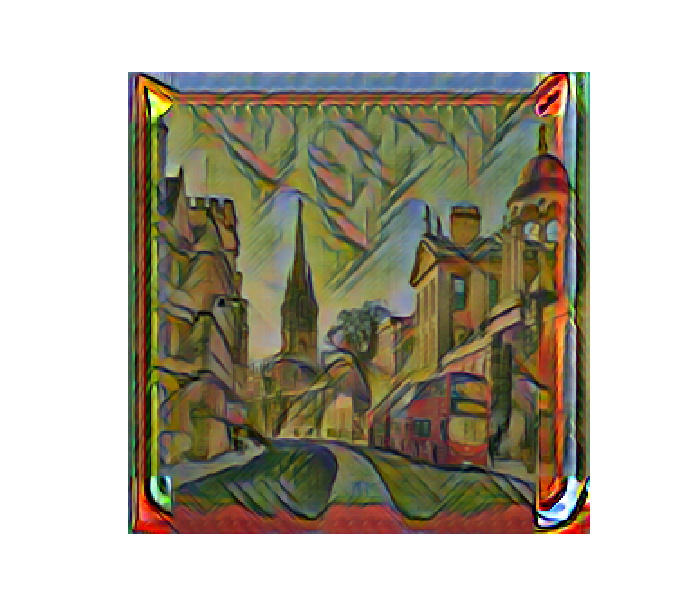

In [22]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('UDnCNNModelD8')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


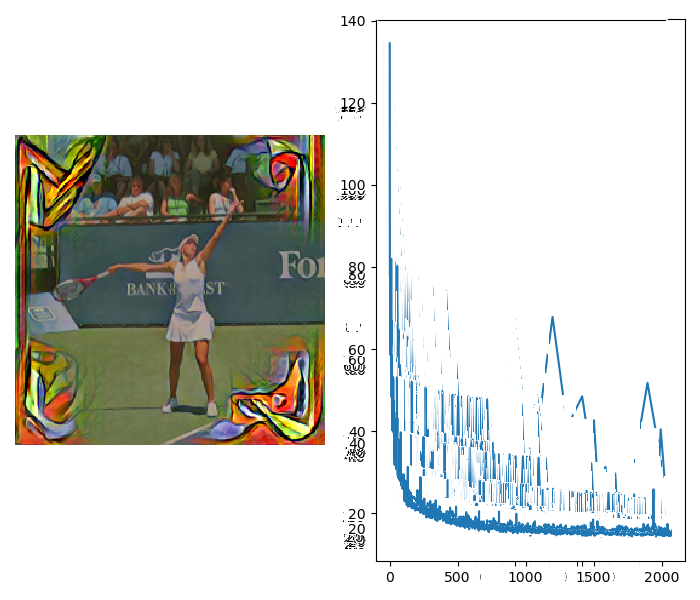

loss tensor(134.4546, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(5.1753, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(126.6858, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(2.5935, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(78.0360, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(5.0494, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(70.8223, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(2.1643, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(78.5585, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(3.2895, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(73.6953, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.5737, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(63.8984, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(4.0637, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(58.3397, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.4

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



loss tensor(18.1852, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.3583, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(6.8087, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.0182, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(18.0375, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.8907, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(6.1429, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.0039, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(16.4688, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.6494, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(4.8250, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.9943, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(17.3621, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.5173, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(5.9076, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.937

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



loss tensor(16.0161, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.4378, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(4.6086, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.9697, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(15.4549, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(9.9288, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(4.5984, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.9277, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(15.7791, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.2835, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(4.5514, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.9442, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(16.2413, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(10.3308, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(4.9166, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.9938

IndexError: index 3 is out of bounds for axis 0 with size 3

In [23]:
# Train a UDnCNN network with depth D = 12
UDnCNN_net = UDnCNN(12).to(device)

net, loss_history = styletransfer(train_set, UDnCNN_net, 'UDnCNNModelD12', device, styleimage, \
                  content_weight=1, style_weight=60, var_weight=5)

<IPython.core.display.Javascript object>


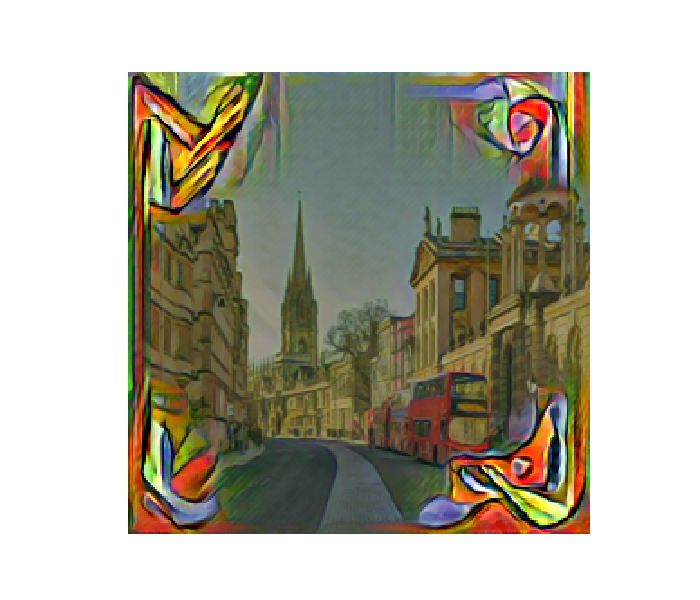

In [24]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('UDnCNNModelD12')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


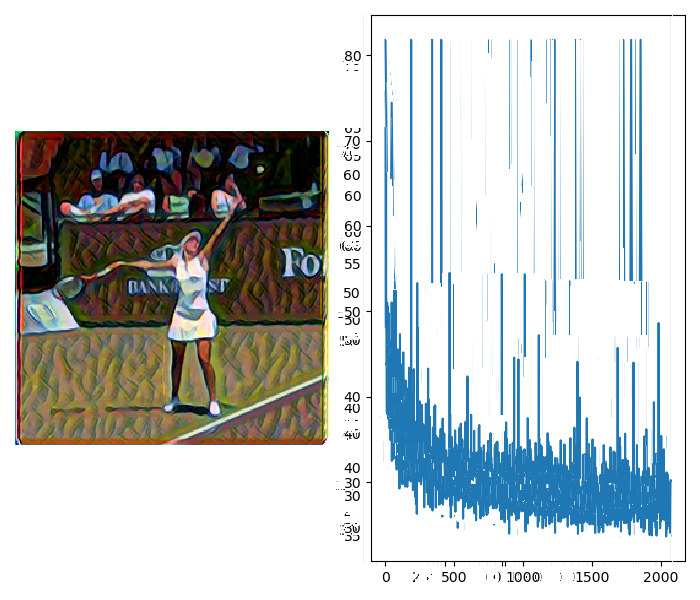

/opt/conda/lib/python3.7/site-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type DUDnCNN. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


loss tensor(71.4523, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(5.2566, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(65.1104, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.0853, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(59.1574, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(4.1384, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(54.2722, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.7467, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(52.6377, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(5.4713, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(46.3288, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.8376, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(48.1301, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(6.1484, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(41.2126, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.769

IndexError: index 3 is out of bounds for axis 0 with size 3

In [25]:
# Train a DUDnCNN network with depth D = 4
DUDnCNN_net = DUDnCNN(4).to(device)

net, loss_history = styletransfer(train_set, DUDnCNN_net, 'DUDnCNNModelD4', device, styleimage, \
                  content_weight=1, style_weight=60, var_weight=5)

<IPython.core.display.Javascript object>


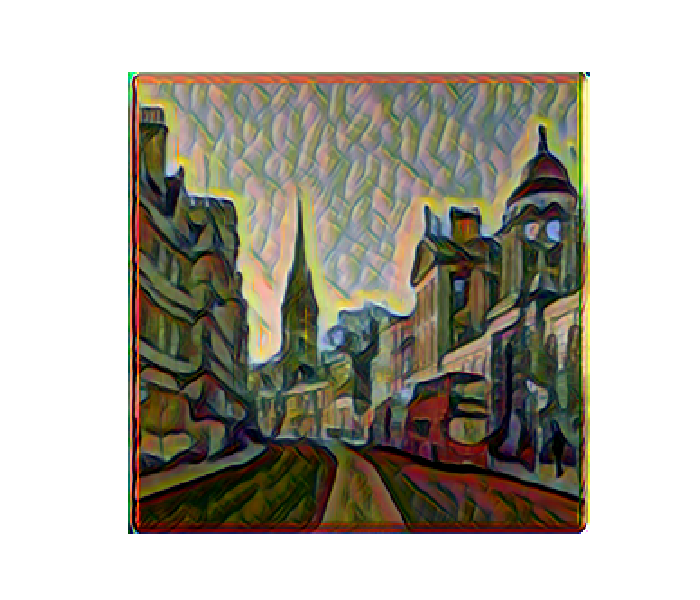

In [26]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('DUDnCNNModelD4')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


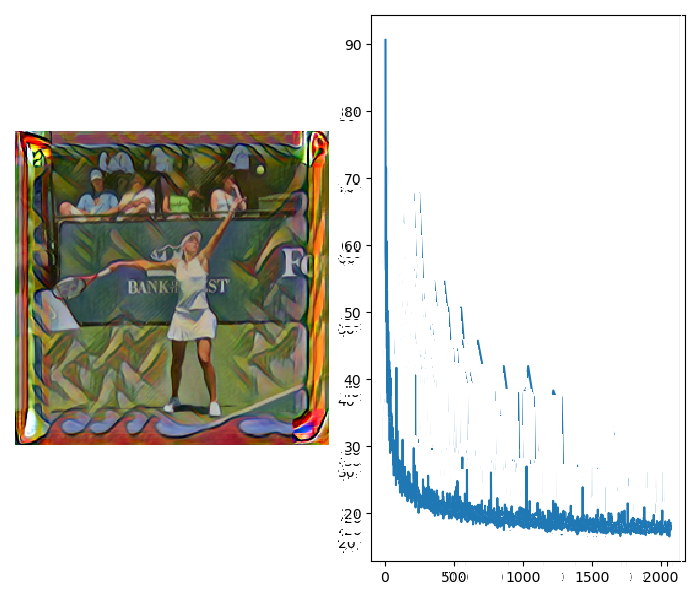

loss tensor(90.6307, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(4.7931, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(84.6348, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.2028, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(58.9341, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(4.1559, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(53.9039, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.8743, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(57.1182, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(4.5437, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(51.5332, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.0413, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(56.2139, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(4.6382, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(50.8678, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.707

IndexError: index 3 is out of bounds for axis 0 with size 3

In [27]:
# Train a DUDnCNN network with depth D = 8
DUDnCNN_net = DUDnCNN(8).to(device)

net, loss_history = styletransfer(train_set, DUDnCNN_net, 'DUDnCNNModelD8', device, styleimage, \
                  content_weight=1, style_weight=60, var_weight=5)

<IPython.core.display.Javascript object>


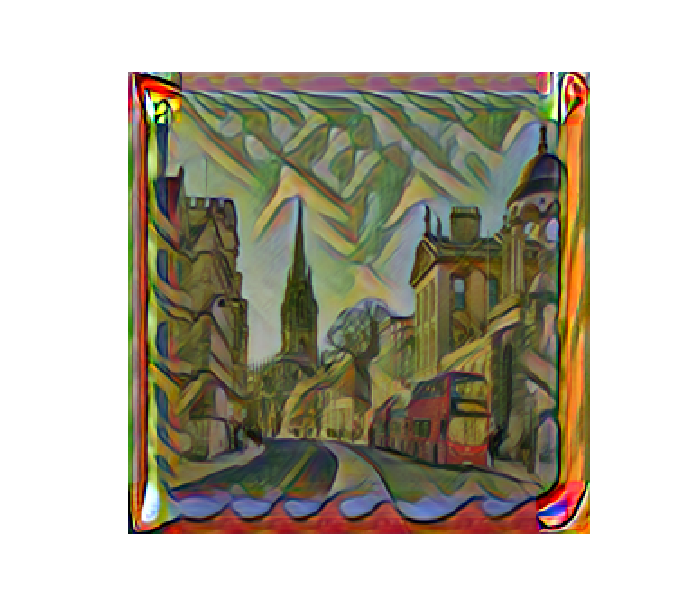

In [28]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('DUDnCNNModelD8')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)

<IPython.core.display.Javascript object>


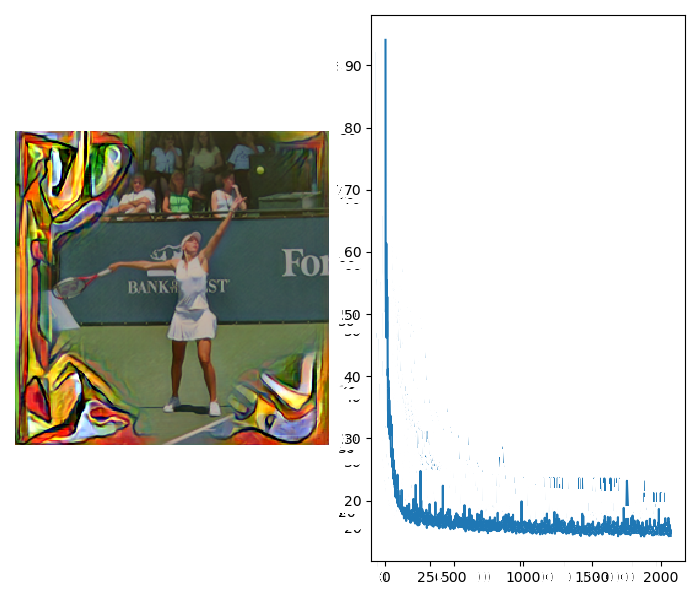

loss tensor(94.1060, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(4.4643, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(88.1231, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(1.5186, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(56.7523, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(5.6160, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(50.3046, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.8316, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(54.4940, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(4.1939, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(49.4720, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.8282, device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(50.3201, device='cuda:0', grad_fn=<AddBackward0>)
contentloss tensor(5.3833, device='cuda:0', grad_fn=<MulBackward0>)
styleloss tensor(44.0989, device='cuda:0', grad_fn=<MulBackward0>)
varloss tensor(0.837

IndexError: index 3 is out of bounds for axis 0 with size 3

In [29]:
# Train a DUDnCNN network with depth D = 12
DUDnCNN_net = DUDnCNN(12).to(device)

net, loss_history = styletransfer(train_set, DUDnCNN_net, 'DUDnCNNModelD12', device, styleimage, \
                  content_weight=1, style_weight=60, var_weight=5)

<IPython.core.display.Javascript object>


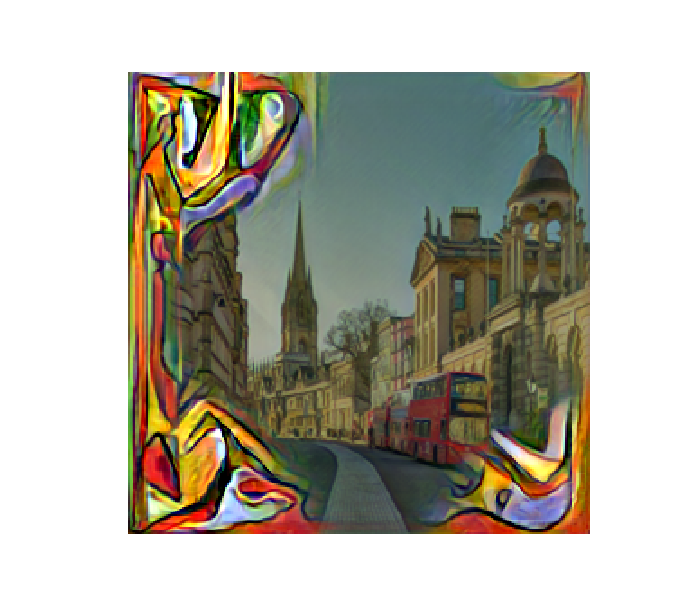

In [30]:
fig1, axes1 = plt.subplots(ncols=1, nrows=1, figsize=(7,6))

model = torch.load('DUDnCNNModelD12')

stylized_image = model(p)
stylized_image = stylized_image.detach().cpu()
stylized_image = stylized_image[0]
myimshow(stylized_image, axes1)